# Project: **Road Lane Line Detection** 

## Import Packages

In [1]:
#importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
%matplotlib inline

## Read in an Image

This image is: <class 'numpy.ndarray'> with dimensions: (540, 960, 3)


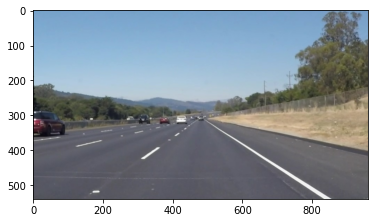

In [2]:
#reading in an image
image = mpimg.imread('test_images/solidWhiteRight.jpg')

#printing out some stats and plotting
print('This image is:', type(image), 'with dimensions:', image.shape)
plt.imshow(image) 

# Lane Detection Pipeline

In [3]:
import math

def grayscale(img):
    """Applies the Grayscale transform
    This will return an image with only one color channel
    but NOTE: to see the returned image as grayscale
    (assuming your grayscaled image is called 'gray')
    you should call plt.imshow(gray, cmap='gray')"""
    return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    
def canny(img, low_threshold, high_threshold):
    """Applies the Canny transform"""
    return cv2.Canny(img, low_threshold, high_threshold)

def gaussian_blur(img, kernel_size):
    """Applies a Gaussian Noise kernel"""
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    `vertices` should be a numpy array of integer points.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image


def draw_lines(img, lines, color=[255, 0, 0], thickness=2):
    """
    NOTE: this is the function you might want to use as a starting point once you want to 
    average/extrapolate the line segments you detect to map out the full
    extent of the lane (going from the result shown in raw-lines-example.mp4
    to that shown in P1_example.mp4).  
    
    Think about things like separating line segments by their 
    slope ((y2-y1)/(x2-x1)) to decide which segments are part of the left
    line vs. the right line.  Then, you can average the position of each of 
    the lines and extrapolate to the top and bottom of the lane.
    
    This function draws `lines` with `color` and `thickness`.    
    Lines are drawn on the image inplace (mutates the image).
    If you want to make the lines semi-transparent, think about combining
    this function with the weighted_img() function below
    """
    for line in lines:
        for x1,y1,x2,y2 in line:
            cv2.line(img, (x1, y1), (x2, y2), color, thickness)

def hough_lines(img, rho, theta, threshold, min_line_len, max_line_gap):
    """
    `img` should be the output of a Canny transform.
        
    Returns an image with hough lines drawn.
    """
    lines = cv2.HoughLinesP(img, rho, theta, threshold, np.array([]), minLineLength=min_line_len, maxLineGap=max_line_gap)
    line_img = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.uint8)
    draw_lines(line_img, lines)
    return line_img, lines

# Python 3 has support for cool math symbols.

def weighted_img(img, initial_img, α=0.8, β=1., γ=0.):
    """
    `img` is the output of the hough_lines(), An image with lines drawn on it.
    Should be a blank image (all black) with lines drawn on it.
    
    `initial_img` should be the image before any processing.
    
    The result image is computed as follows:
    
    initial_img * α + img * β + γ
    NOTE: initial_img and img must be the same shape!
    """
    return cv2.addWeighted(initial_img, α, img, β, γ)

# Test Images and Explore Color Spaces for Options

In [4]:
import os
os.listdir("test_images/")

['solidWhiteCurve.jpg',
 'solidWhiteRight.jpg',
 'solidYellowCurve.jpg',
 'solidYellowCurve2.jpg',
 'solidYellowLeft.jpg',
 'video_challenge_0s.jpg',
 'video_challenge_1s.jpg',
 'video_challenge_2s.jpg',
 'video_challenge_4s.jpg',
 'video_challenge_5s.jpg',
 'video_challenge_6s.jpg',
 'whiteCarLaneSwitch.jpg']

In [5]:
def change_color_space(img, color_space='HSV'):  # input img to be format RGB
    space = cv2.COLOR_RGB2HSV
    if color_space == 'HLS':
        space = cv2.COLOR_RGB2HLS
    if color_space == 'LAB':
        space = cv2.COLOR_RGB2LAB
    if color_space == 'RGB':
        space = None
    if space is not None:
        img_copy = cv2.cvtColor(img, space)
    else:
        img_copy = img   # we stay in RGB
    
    return img_copy

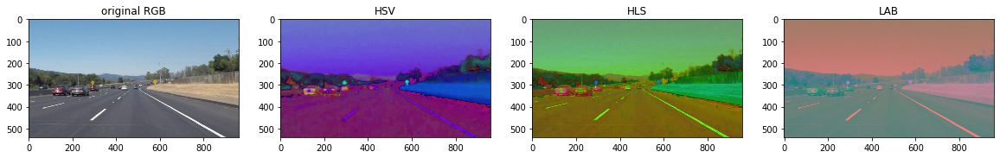

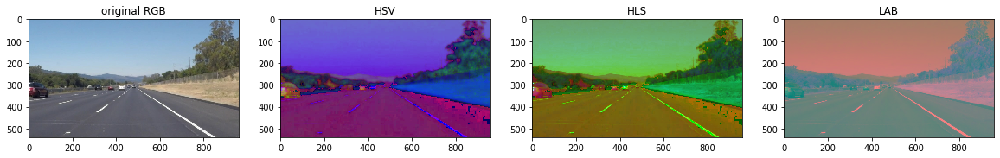

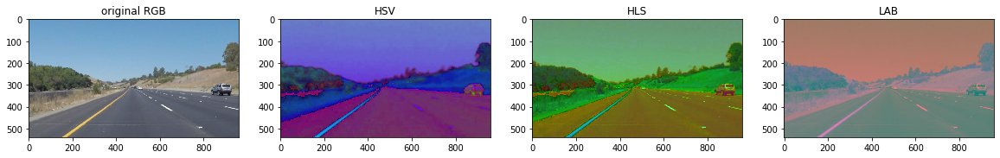

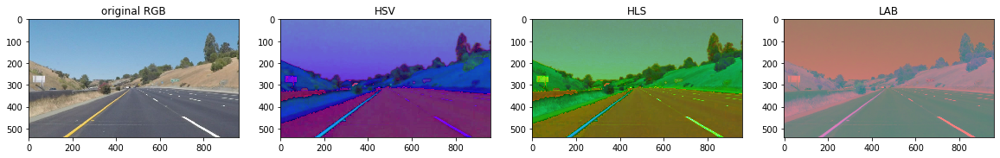

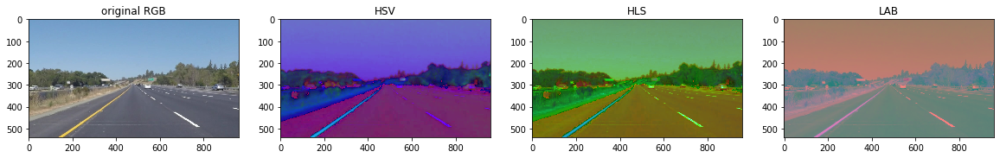

...

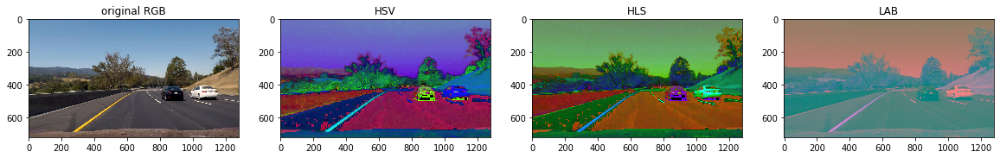

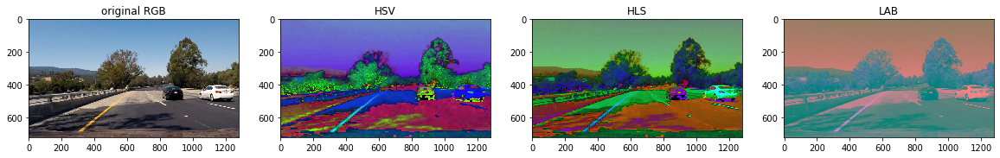

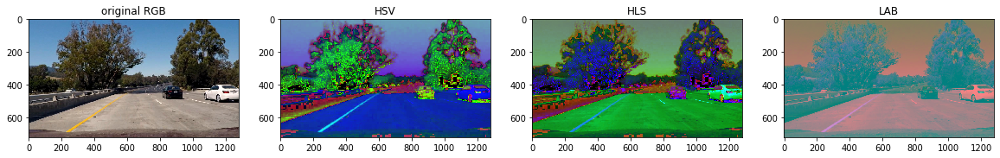

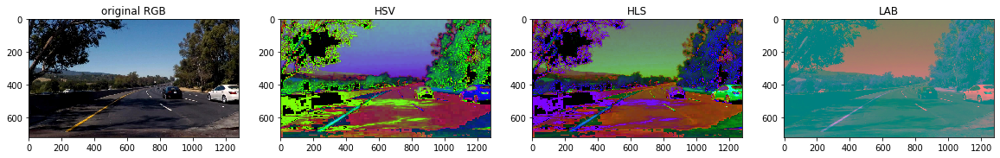

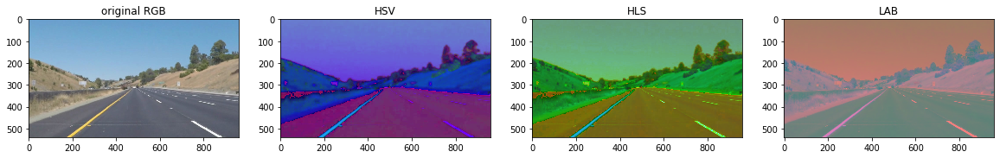

In [515]:
for name_img in os.listdir("test_images/"):
    image = mpimg.imread('test_images/'+name_img)
    plt.figure(figsize=(20,20))
    plt.subplot(1,4,1)
    plt.imshow(image)
    plt.title('original RGB')
    img = change_color_space(image, 'HSV')  # HSV per default
    plt.subplot(1,4,2)
    plt.imshow(img)
    plt.title('HSV')
    img = change_color_space(image,'HLS')
    plt.subplot(1,4,3)
    plt.imshow(img)
    plt.title('HLS')
    img = change_color_space(image,'LAB')
    plt.subplot(1,4,4)
    plt.imshow(img)
    plt.title('LAB')
plt.show()

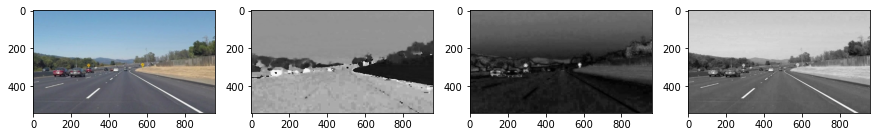

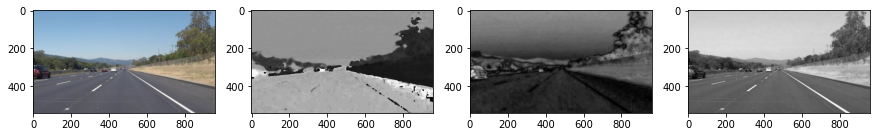

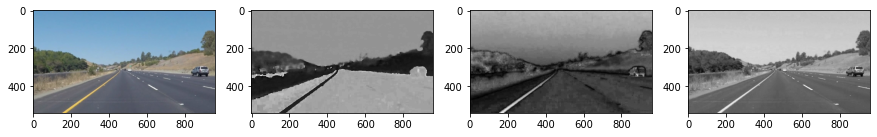

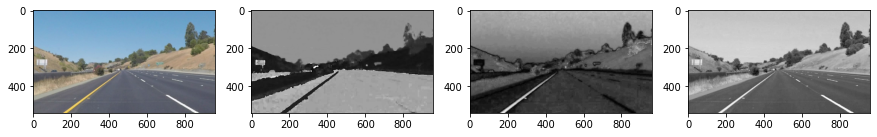

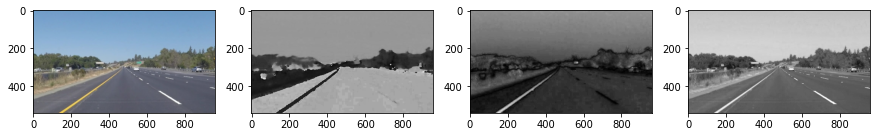

...

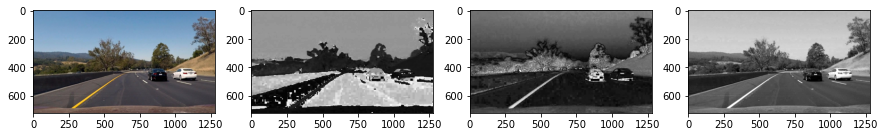

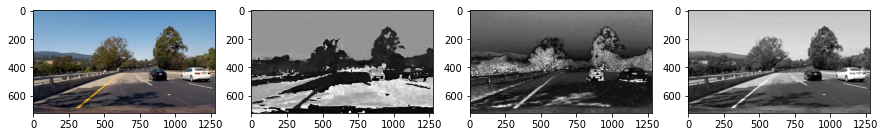

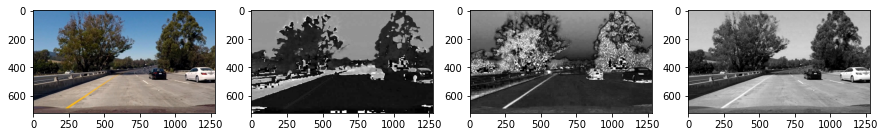

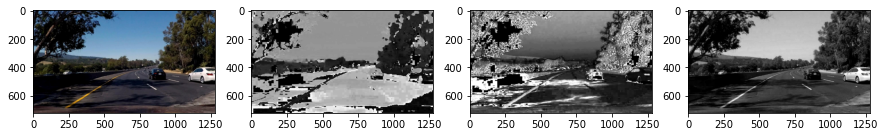

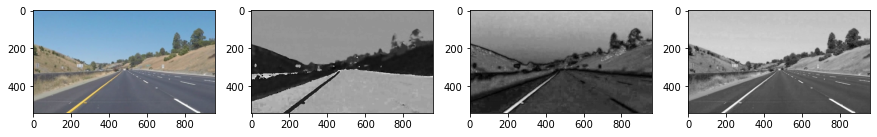

In [6]:
for name_img in os.listdir("test_images/"):
    image = mpimg.imread('test_images/'+name_img)
    plt.figure(figsize=(15,20))
    plt.subplot(1,4,1)
    plt.imshow(image)
    new_img = change_color_space(image, 'HSV')
    for channel in range(3):
        isolated_channel_image = new_img[:,:,channel]
        plt.subplot(1,4,channel+2)
        plt.imshow(isolated_channel_image, cmap='gray')
    plt.show()

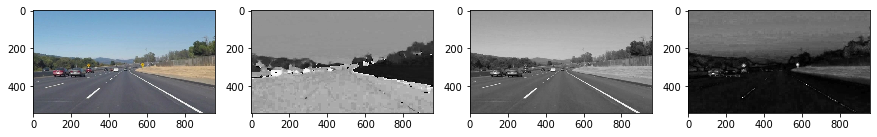

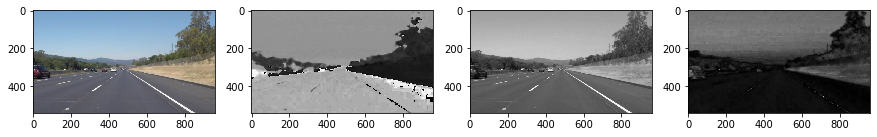

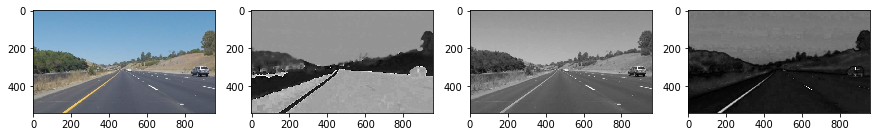

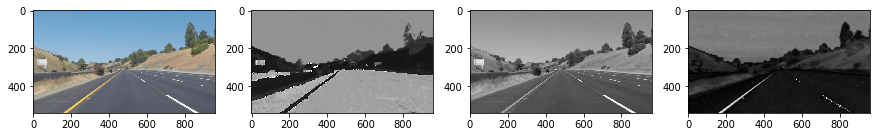

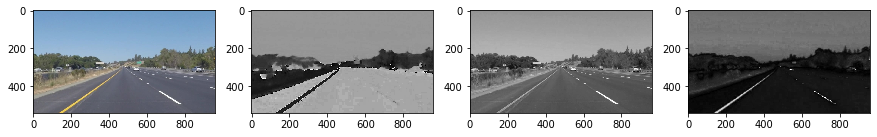

...

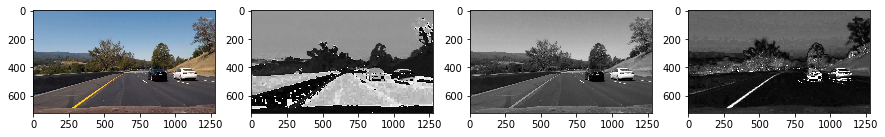

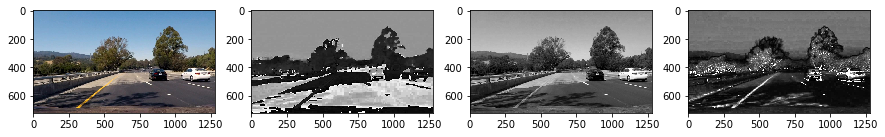

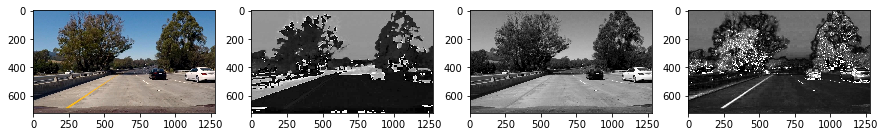

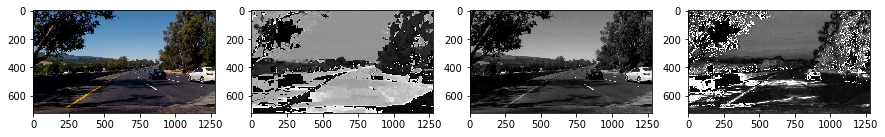

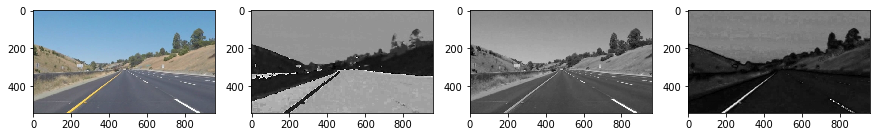

In [311]:
for name_img in os.listdir("test_images/"):
    image = mpimg.imread('test_images/'+name_img)
    plt.figure(figsize=(15,20))
    plt.subplot(1,4,1)
    plt.imshow(image)
    new_img = change_color_space(image, 'HLS')
    for channel in range(3):
        isolated_channel_image = new_img[:,:,channel]
        plt.subplot(1,4,channel+2)
        plt.imshow(isolated_channel_image, cmap='gray')
    plt.show()

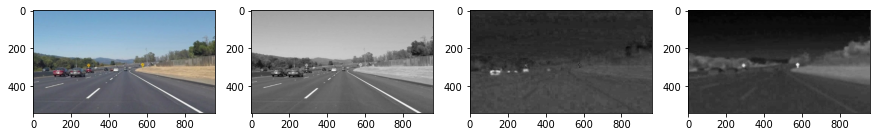

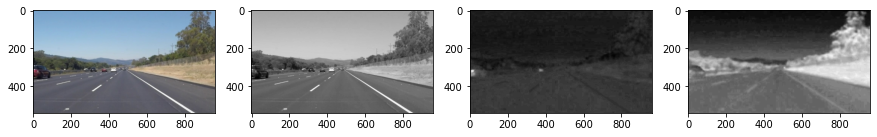

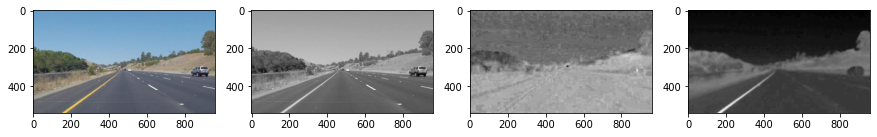

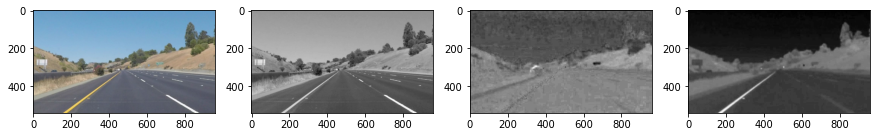

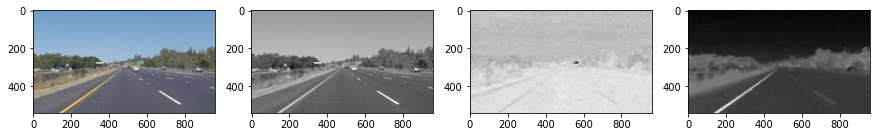

...

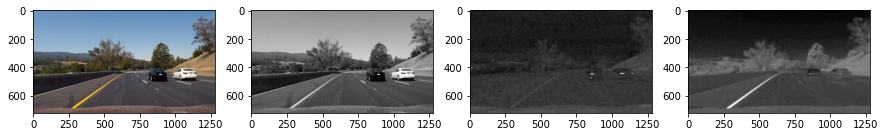

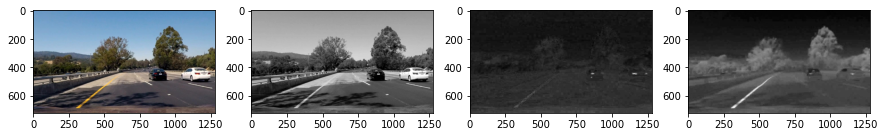

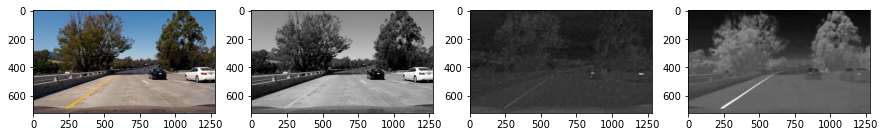

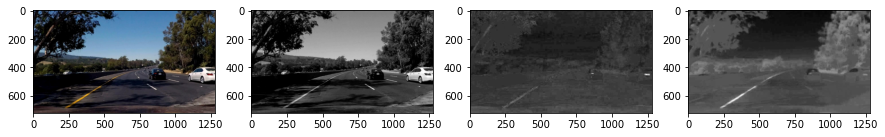

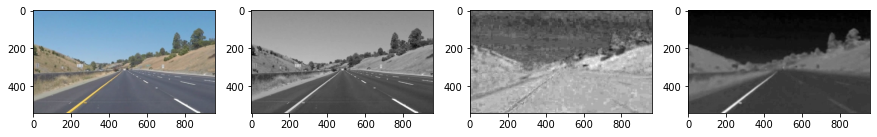

In [7]:
for name_img in os.listdir("test_images/"):
    image = mpimg.imread('test_images/'+name_img)
    plt.figure(figsize=(15,20))
    plt.subplot(1,4,1)
    plt.imshow(image)
    new_img = change_color_space(image, 'LAB')  # HSV per default
    for channel in range(3):
        isolated_channel_image = new_img[:,:,channel]
        plt.subplot(1,4,channel+2)
        plt.imshow(isolated_channel_image, cmap='gray')
    plt.show()
    

In [9]:
# EXTRACT YELLOW LINES USING LAB COLOR SPACE
images={}     # This dictionary will collect all the output of the filtering and analysis developped lengthly below

# Convert images to LAB color space and store in dictionary for later use
for index, name_img in enumerate(os.listdir("test_images/")):
    image = mpimg.imread('test_images/'+name_img)
    if image.shape[2]>3:
        image = image[:,:,:3]
    LAB_img = change_color_space(image,'LAB')
    images[index]={'original': image, 'LAB': LAB_img, 'B_channel': LAB_img[:,:,2]}
print('number of LAB images: ', len(LAB_img))

number of LAB images:  540


In [10]:
def extract_line(img, lower, upper):
    mask = cv2.inRange(img, np.array(lower,dtype=np.uint8), np.array(upper, dtype=np.uint8))
    return mask

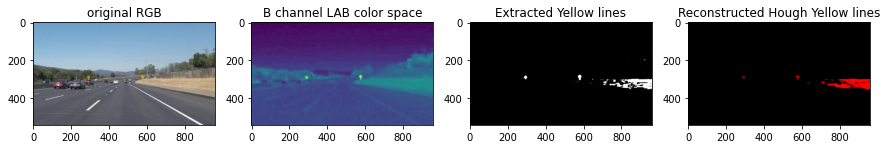

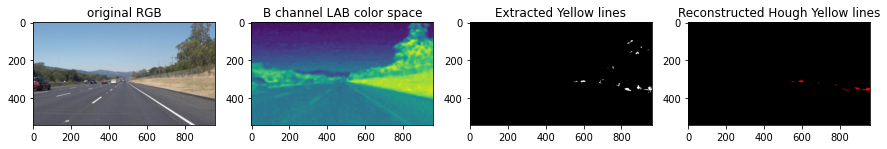

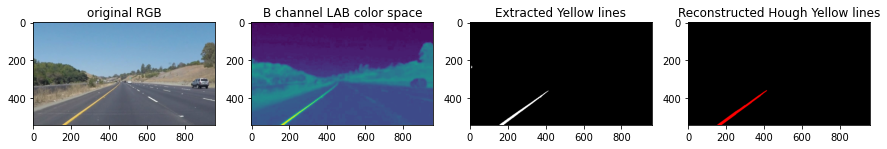

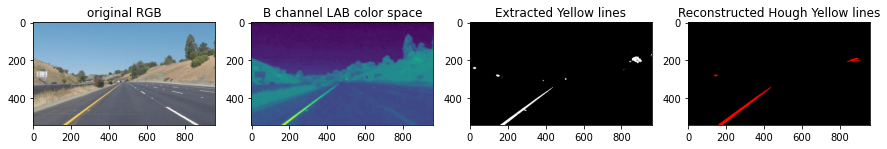

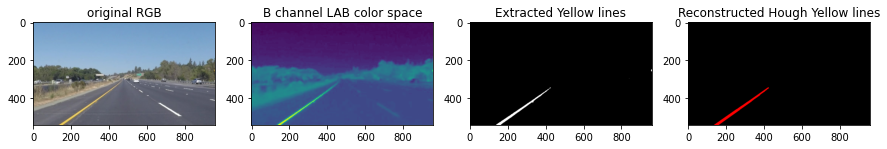

...

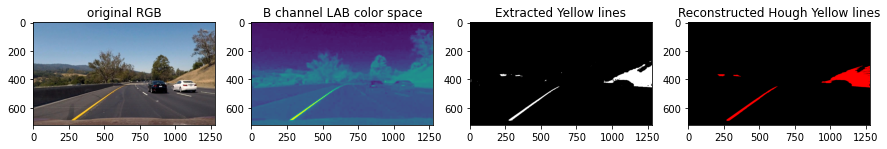

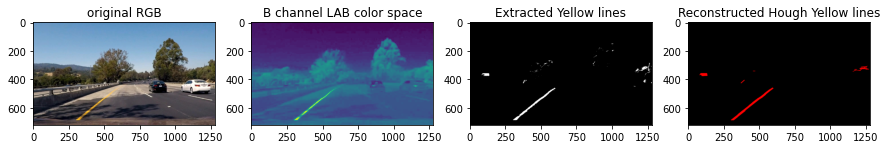

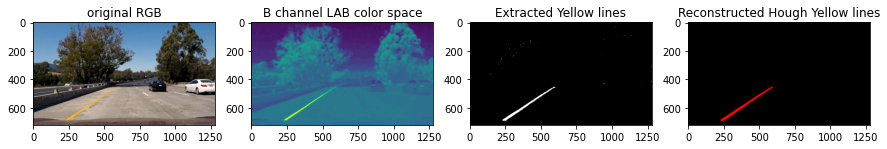

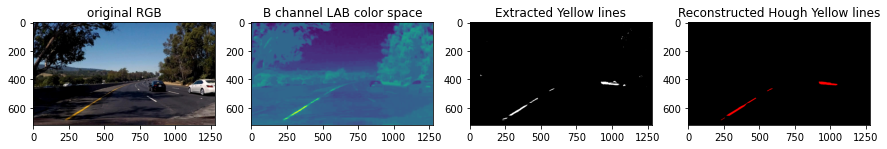

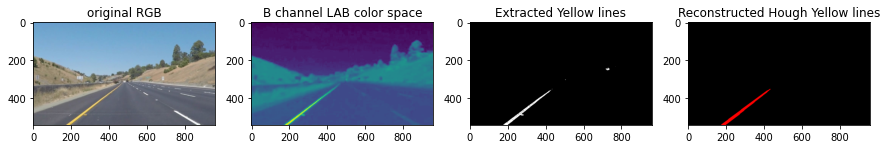

In [11]:
for index in range(len(images)):
    img = images[index]['original']
    LAB_img = images[index]['LAB']
    B_ch = images[index]['B_channel']
    plt.figure(figsize=(15,20))
    plt.subplot(1,4,1)
    plt.imshow(img)
    plt.title('original RGB')
    plt.subplot(1,4,2)
    plt.imshow(B_ch)
    plt.title('B channel LAB color space')
    yellow_lines = extract_line(LAB_img, [100,100,150], [220,180,255])
    plt.subplot(1,4,3)
    plt.imshow(yellow_lines, cmap = 'gray')
    plt.title('Extracted Yellow lines')
    hough_img, lines = hough_lines(yellow_lines, rho=1, theta=np.pi/180, threshold=50, min_line_len=10, max_line_gap=10)
    plt.subplot(1,4,4)
    plt.imshow(hough_img, cmap = 'gray')
    plt.title('Reconstructed Hough Yellow lines')
    
    images[index]['yellow_mask'] = yellow_lines
    images[index]['hough_image_y'] = hough_img
    images[index]['hough_yellow_lines'] = lines
    
    
plt.show()

In [12]:
# EXTRACT WHITE LANES USING HLS COLOR SPACE
# Convert sample images to HLS
for index, name_img in enumerate(os.listdir("test_images/")):
    assert len(os.listdir("test_images/"))==len(images), "number of test images has changed, please rebuild image dictionary from the start"
    image = mpimg.imread('test_images/'+name_img)
    HLS_img = change_color_space(image,'HLS')
    images[index]['HLS'] = HLS_img
print('number of HLS images: ', len(images))

number of HLS images:  12


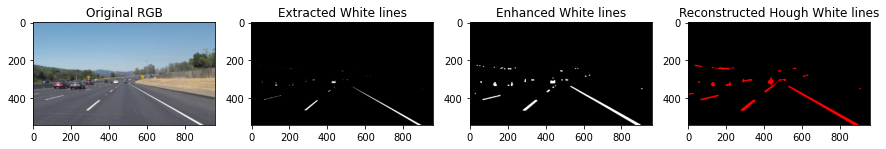

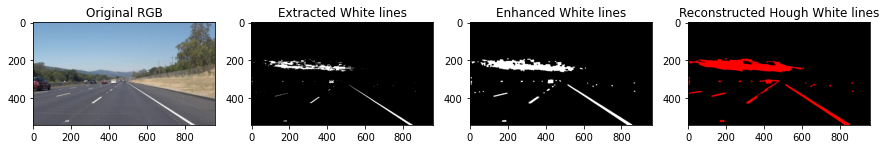

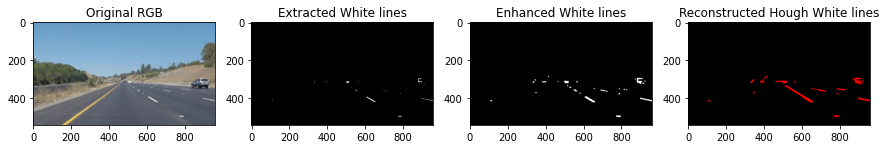

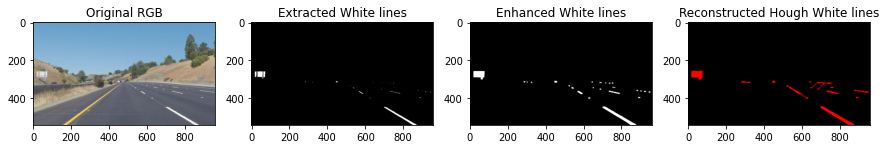

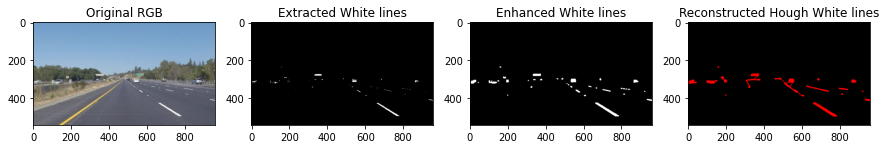

...

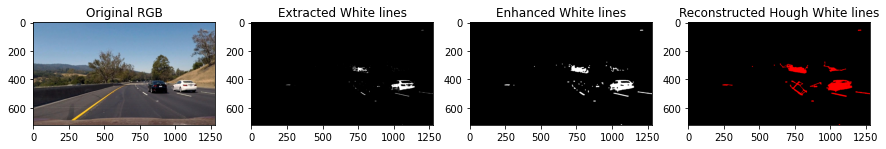

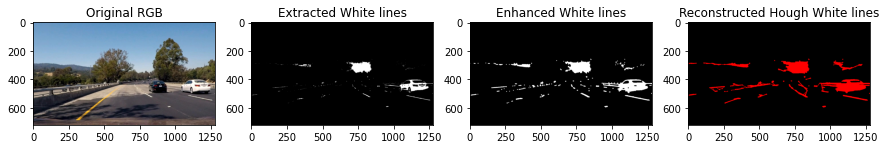

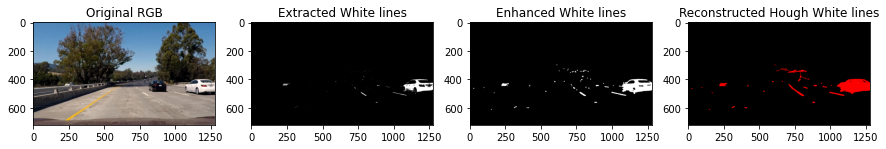

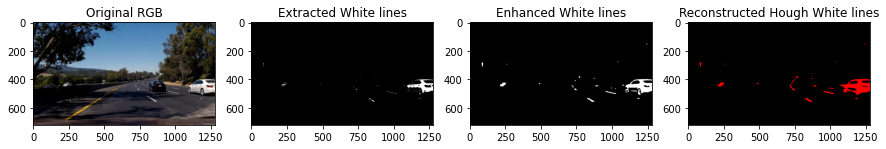

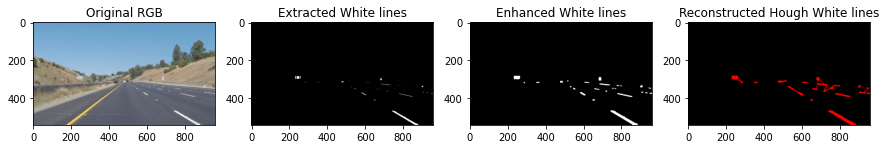

In [13]:
# Extract White lines
for index in range(len(images)):
    img = images[index]['original']
    HLS_img = images[index]['HLS']
    plt.figure(figsize=(15,20))
    plt.subplot(1,4,1)
    plt.imshow(img)
    plt.title('Original RGB')
    white_lines = extract_line(HLS_img, [0,200,0], [180,255,255])  # white
    plt.subplot(1,4,2)
    plt.imshow(white_lines, cmap = 'gray')
    plt.title('Extracted White lines')
    white_lines = cv2.dilate(white_lines, kernel=np.ones((5,5), np.uint8), iterations=2)
    white_lines = cv2.erode(white_lines, kernel=np.ones((5,5), np.uint8), iterations=2)
    white_lines = cv2.dilate(white_lines, kernel=np.ones((5,5), np.uint8), iterations=1)
    # white_lines = canny(white_lines, 50,150)
    plt.subplot(1,4,3)
    plt.imshow(white_lines, cmap = 'gray')
    plt.title('Enhanced White lines')
    
    hough_img, lines = hough_lines(white_lines, rho=1, theta=np.pi/180, threshold=5, min_line_len=3, max_line_gap=30)
    plt.subplot(1,4,4)
    plt.imshow(hough_img, cmap = 'gray')
    plt.title('Reconstructed Hough White lines')
    
    images[index]['white_mask'] = white_lines
    images[index]['hough_image_w'] = hough_img
    images[index]['hough_white_lines'] = lines
    
plt.show()

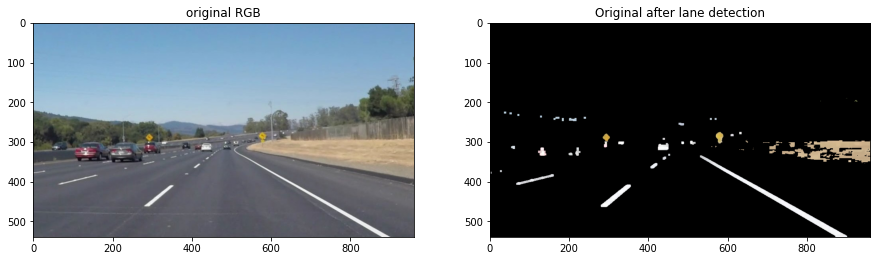

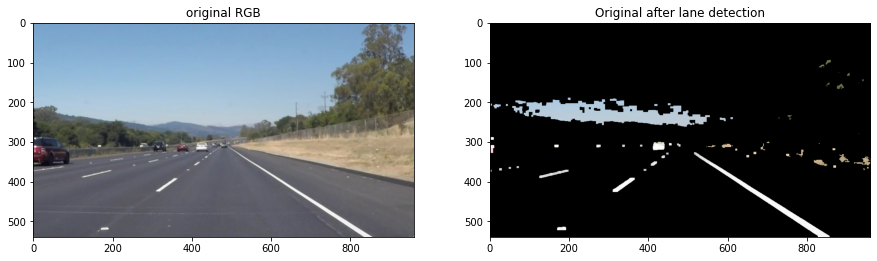

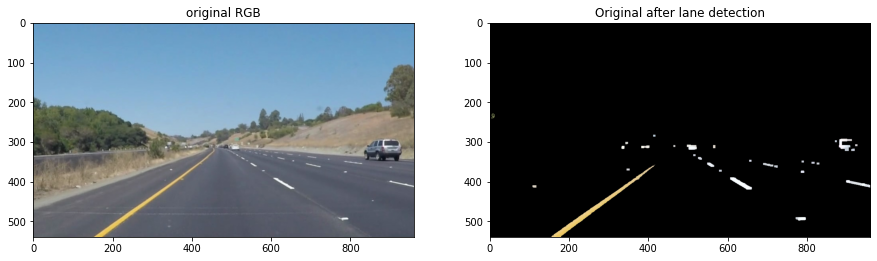

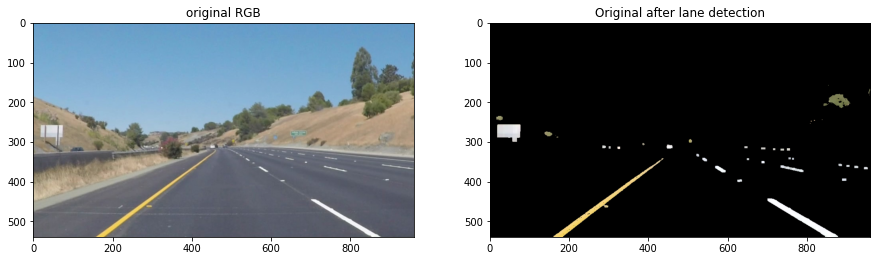

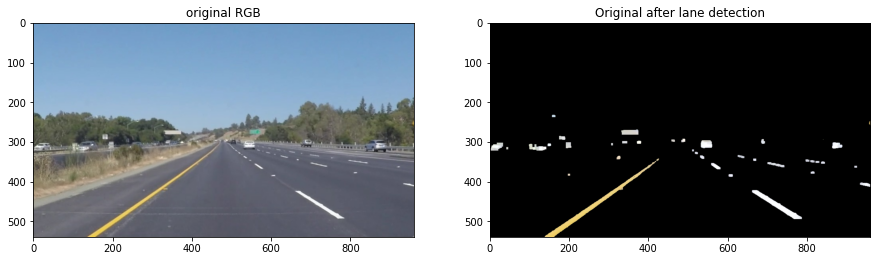

...

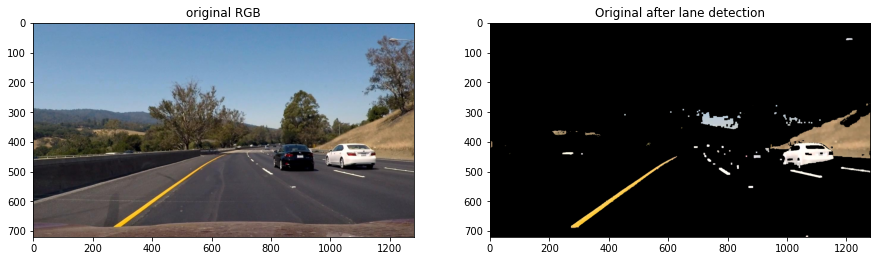

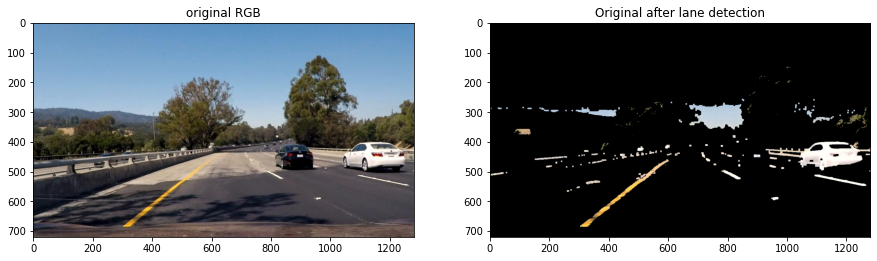

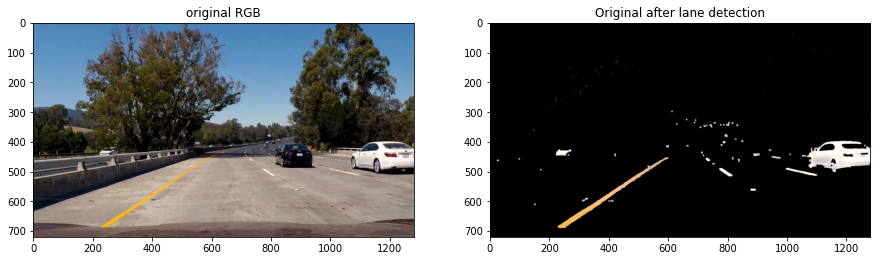

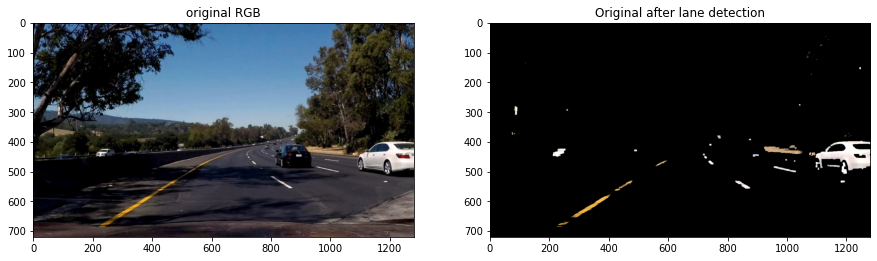

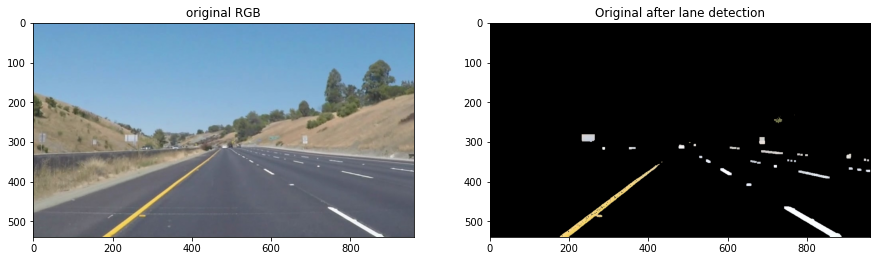

In [14]:
# Combine both lane extractions
for index in range(len(images)):
    img = images[index]['original']
    yellow_lines = images[index]['yellow_mask']
    white_lines = images[index]['white_mask']
    plt.figure(figsize=(15,20))
    plt.subplot(1,2,1)
    plt.imshow(img)
    plt.title('original RGB')
    line_mask = yellow_lines + white_lines
    masked_img = np.copy(img)
    masked_img = cv2.dilate(masked_img, kernel=np.ones((5,5), np.uint8), iterations=2)
    masked_img = cv2.erode(masked_img, kernel=np.ones((5,5), np.uint8), iterations=2)
    masked_img = cv2.dilate(masked_img, kernel=np.ones((5,5), np.uint8), iterations=1)
    masked_img[line_mask!=255] = [0,0,0]
    plt.subplot(1,2,2)
    plt.imshow(masked_img)
    plt.title('Original after lane detection')
    images[index]['masked'] = masked_img
plt.show()

In [15]:
# CLEAN UP COMBINED LANE EXTRACTION USING AREA OF INTEREST TO REMOVE SURROUNDING NOISE

def get_vertices_for_img(img):
    imshape = img.shape
    height = imshape[0]
    width = imshape[1]

    vert = None
    
    if (width, height) == (960, 540):
        region_bottom_left = (130 ,imshape[0] - 1)
        region_top_left = (410, 330)
        region_top_right = (650, 350)
        region_bottom_right = (imshape[1] - 30,imshape[0] - 1)
        vert = np.array([[region_bottom_left , region_top_left, region_top_right, region_bottom_right]], dtype=np.int32)
    else:
        region_bottom_left = (200 , 680)
        region_top_left = (600, 450)
        region_top_right = (750, 450)
        region_bottom_right = (1100, 650)
        vert = np.array([[region_bottom_left , region_top_left, region_top_right, region_bottom_right]], dtype=np.int32)

    return vert


def region_of_interest(img):
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
        
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    vert = get_vertices_for_img(img)    
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vert, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

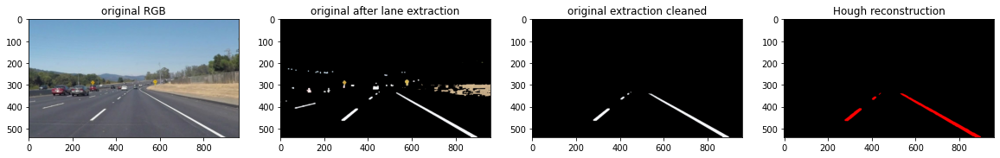

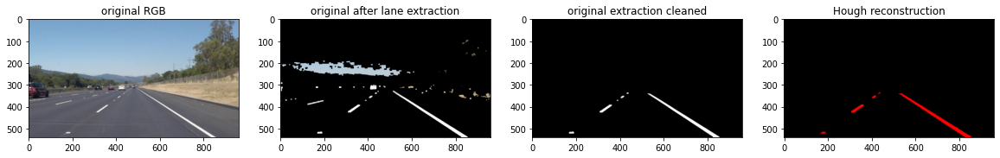

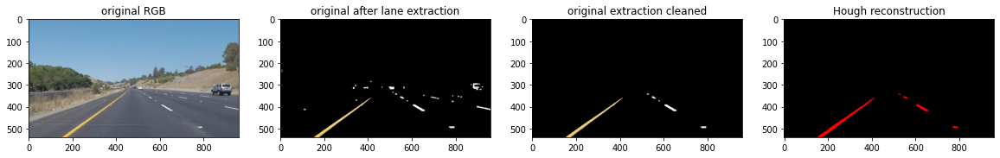

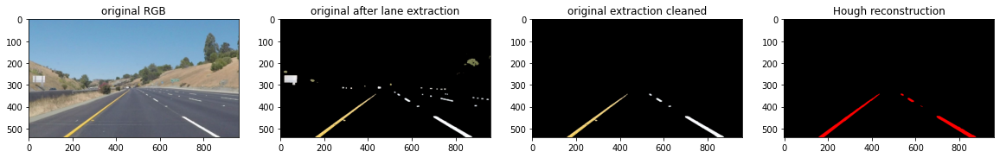

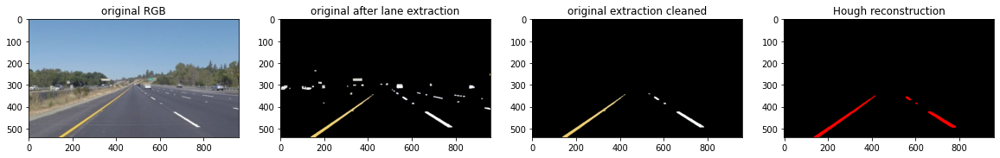

...

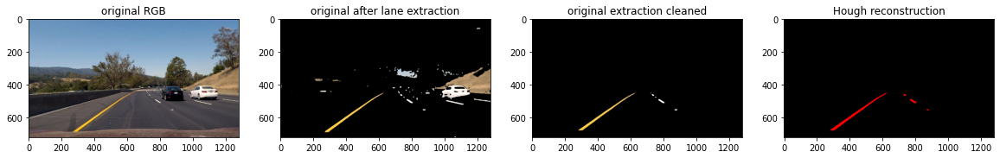

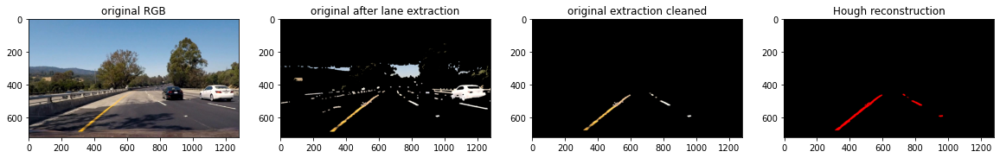

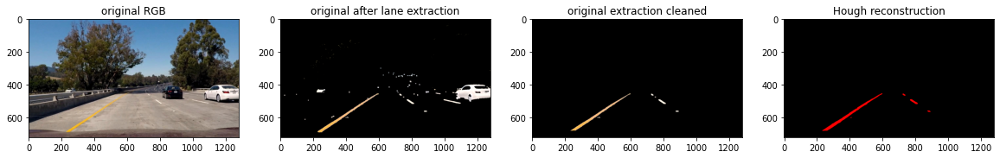

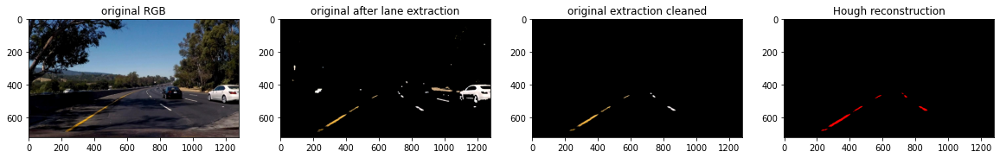

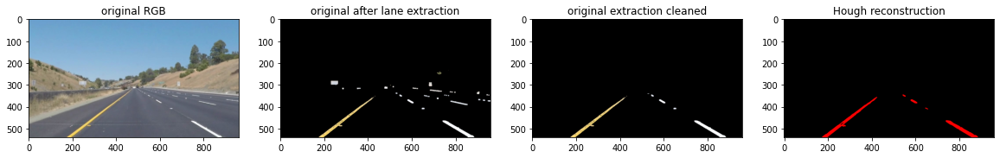

In [17]:
for index in range(len(images)):
    img = images[index]['original']
    masked = images[index]['masked']
    plt.figure(figsize=(20,20))
    plt.subplot(1,4,1)
    plt.imshow(img)
    plt.title('original RGB')
    plt.subplot(1,4,2)
    plt.imshow(masked)
    plt.title('original after lane extraction')
    
    cleaned_img = region_of_interest(masked)
    plt.subplot(1,4,3)
    plt.imshow(cleaned_img)
    plt.title('original extraction cleaned')
    
    hough_img, lines = hough_lines(grayscale(cleaned_img), rho=1, theta=np.pi/180, threshold=17, min_line_len=7, max_line_gap=0)
    plt.subplot(1,4,4)
    plt.imshow(hough_img)
    plt.title('Hough reconstruction')
    
    images[index]['cleaned'] = cleaned_img
    images[index]['hough_lines'] = lines
    plt.show()

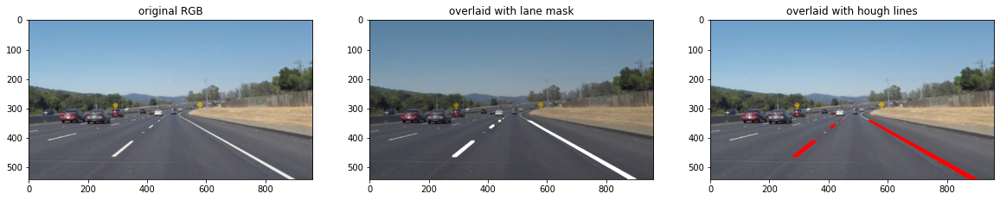

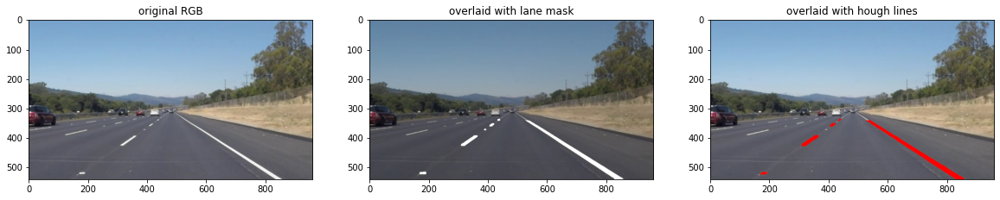

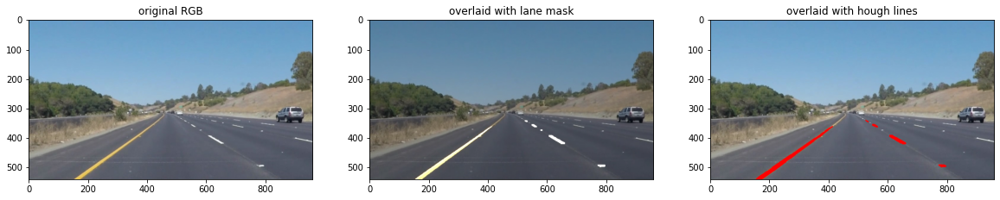

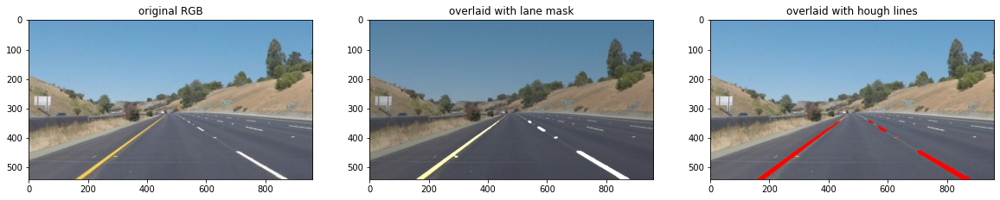

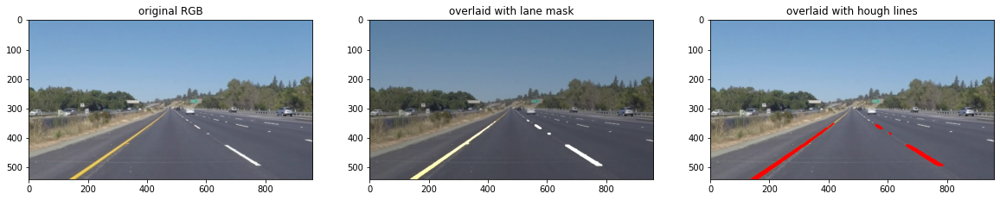

...

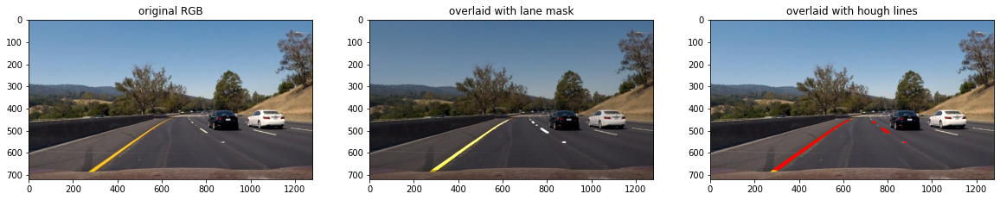

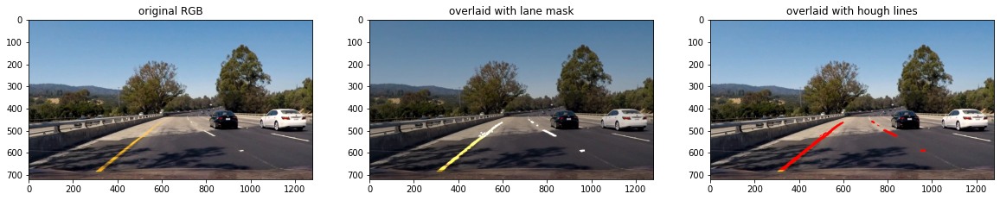

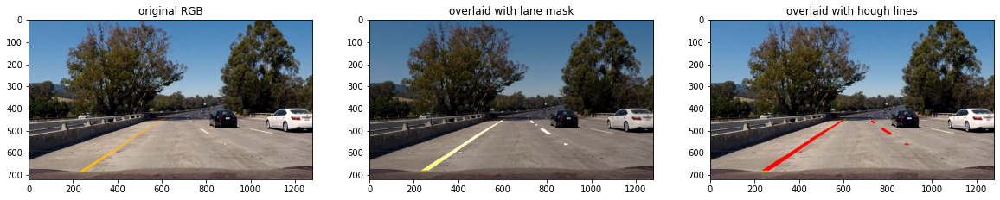

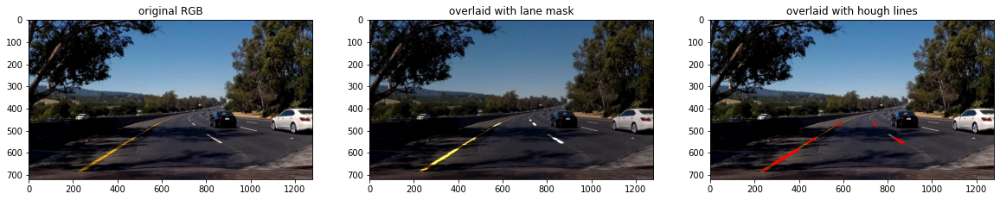

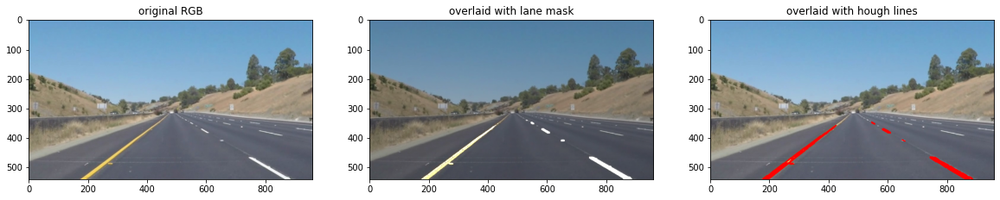

In [18]:
# PLOT ORIGINAL IMAGE, IMAGE OVERLAID WITH EXTRACTED LANE MASK AND IMAGE OVERLAID WITH HOUGH LINES DRAWN
for index in range(len(images)):
    img = images[index]['original']
    cleaned = images[index]['cleaned']
    lines = images[index]['hough_lines']
    
    # Original image overlaid with extracted lane mask
    img_with_lines = weighted_img(cleaned, img, α=0.8, β=1., γ=0.) 
    
    # Original image overlaid with drawing of hough lines
    copy_img = np.copy(img)
    draw_lines(copy_img, lines, color=[255, 0, 0], thickness=2)
    
    plt.figure(figsize=(20,20))
    plt.subplot(1,3,1)
    plt.imshow(img)
    plt.title('original RGB')
    plt.subplot(1,3,2)
    plt.imshow(img_with_lines)
    plt.title('overlaid with lane mask')
    plt.subplot(1,3,3)
    plt.imshow(copy_img)
    plt.title('overlaid with hough lines')
    
    images[index]['with_lines'] = img_with_lines
    plt.show()

In [19]:

from scipy import stats

def find_lane_lines_formula(lines):
    xs = []
    ys = []
    
    for line in lines:
        for x1, y1, x2, y2 in line:
            xs.append(x1)
            xs.append(x2)
            ys.append(y1)
            ys.append(y2)
    
    slope, intercept, r_value, p_value, std_err = stats.linregress(xs, ys)
    
    return (slope, intercept)

In [20]:
def draw_full_lines(img, slope, intersept, color, thickness):
    y = np.array([int(img.shape[0]*0.63),img.shape[0]-1], 'float')
    x = (y - intersept)/slope
    cv2.line(img, (int(x[0]), int(y[0])), (int(x[1]), int(y[1])), color, thickness)

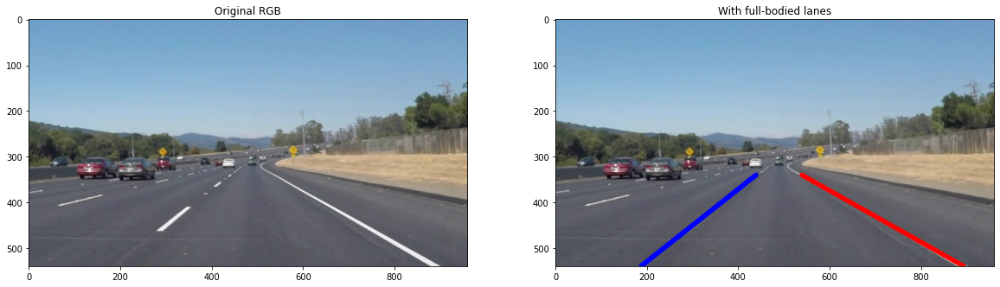

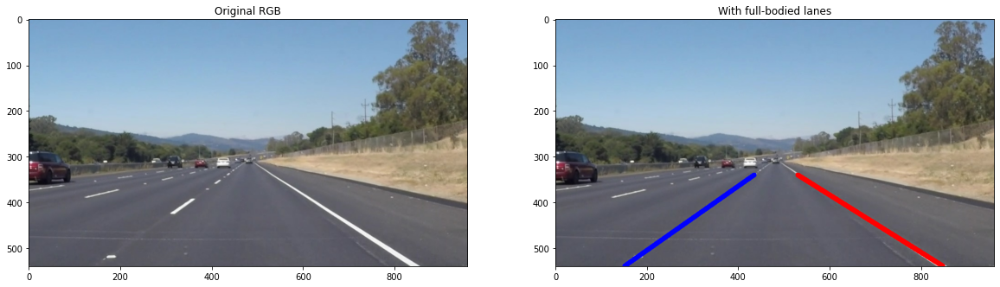

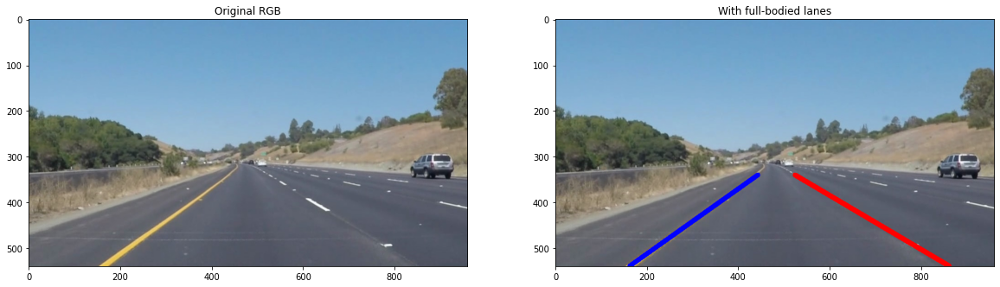

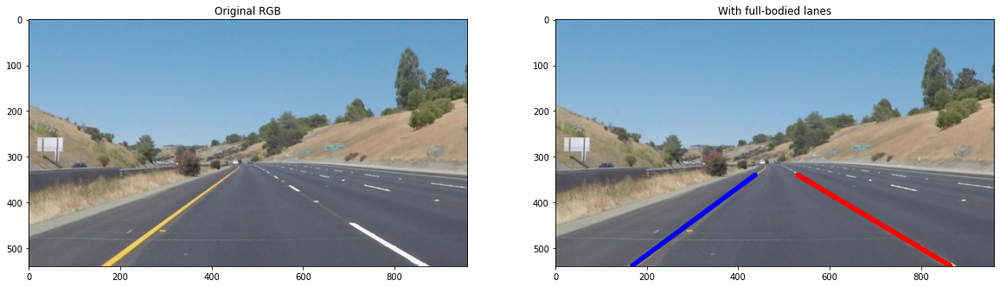

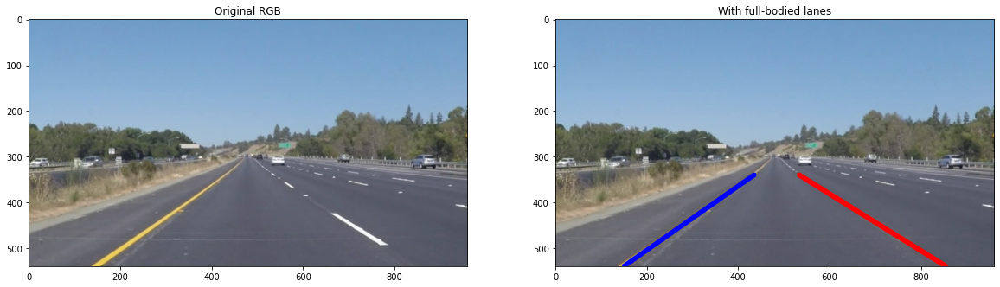

...

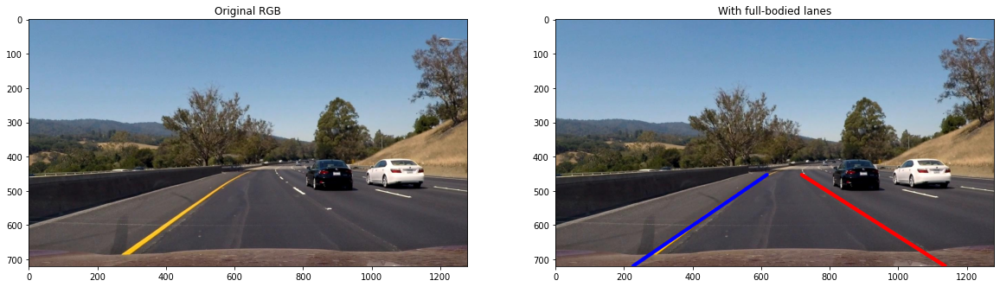

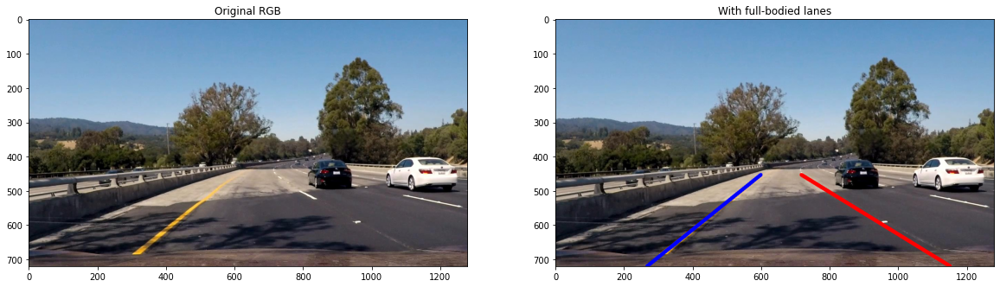

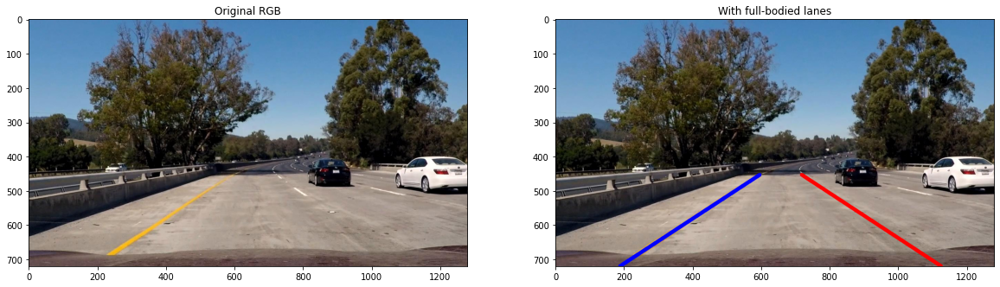

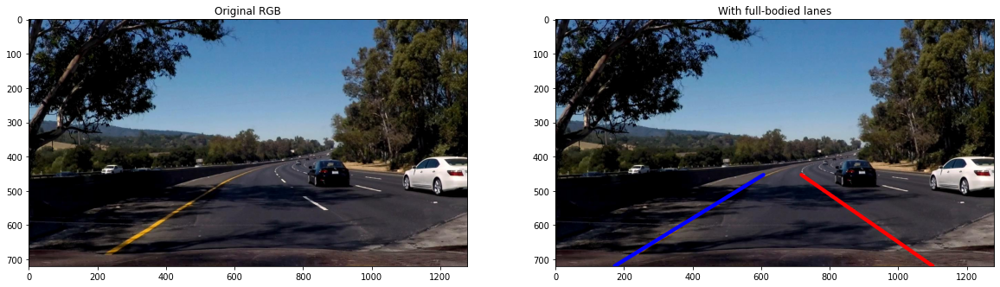

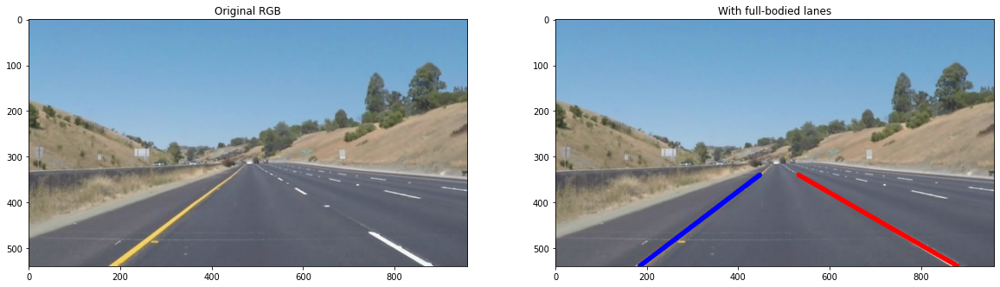

In [21]:
# SEPARATE LEFT FROM RIGHT LANES, COLOR CODE AND DRAW FULL BODIED LINES
for index in range(len(images)):
        
    img = images[index]['original']
    lines = images[index]['hough_lines']
    copy_img = np.copy(img)
    
    right_lanes = []
    left_lanes = []
    
    epsilon = 0.5                          # treshold removing horizontal lanes using slope
    middle_region_x = img.shape[1]/2       # treshold on validating left and right lanes
    
    for line in lines:
        x1,y1,x2,y2 = line[0]
        
        if (x2-x1)!=0 and (y2-y1)!=0 :
            slope = (y2-y1)/(x2-x1)
            
            if abs(slope) > epsilon:
        
                if slope > 0 and middle_region_x<x1<x2:     # Define the right lane
            
                    right_lanes.append([[x1,y1,x2,y2]])
                    
                elif slope < 0 and x1<x2<middle_region_x:   # Define the left lane
                    
                    left_lanes.append([[x1,y1,x2,y2]])
    
    # Draw the right lane in RED using helper function
    slope, intersept = find_lane_lines_formula(right_lanes)
    color=[255, 0, 0]
    draw_full_lines(copy_img, slope, intersept, color, 10)
    
    # Draw the right lane in BLUE using helper function
    slope, intersept = find_lane_lines_formula(left_lanes)
    color=[0, 0, 255]
    draw_full_lines(copy_img, slope, intersept, color, 10)
    
    plt.figure(figsize=(20,20))
    plt.subplot(1,2,1)
    plt.imshow(img)
    plt.title('Original RGB')
    plt.subplot(1,2,2)
    plt.imshow(copy_img)
    plt.title('With full-bodied lanes')
    
    images[index]['Left_Right_Colored_lines'] = copy_img
    plt.show()

In [23]:
# TODO: Build your pipeline that will draw lane lines on the test_images
# then save them to the test_images_output directory.
from PIL import Image  
import PIL
directory = 'test_images_output'
for index, name_img in enumerate(os.listdir("test_images/")):
    saved_image = images[index]['Left_Right_Colored_lines']
    Image.fromarray(saved_image).save(os.path.join(directory,name_img))

# Test on Videos


In [24]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [25]:
def process_image(image):
    
    LAB_img = change_color_space(image,'LAB')
    yellow_lines = extract_line(LAB_img, [100,100,150], [220,180,255])
    
    HLS_img = change_color_space(image,'HLS')
    white_lines = extract_line(HLS_img, [0,200,0], [180,255,255])  # white
    
    white_lines = cv2.dilate(white_lines, kernel=np.ones((5,5), np.uint8), iterations=2)
    white_lines = cv2.erode(white_lines, kernel=np.ones((5,5), np.uint8), iterations=2)
    white_lines = cv2.dilate(white_lines, kernel=np.ones((5,5), np.uint8), iterations=1)
    
    line_mask = yellow_lines + white_lines
    
    masked_img = np.copy(image)
    masked_img = cv2.dilate(masked_img, kernel=np.ones((5,5), np.uint8), iterations=2)
    masked_img = cv2.erode(masked_img, kernel=np.ones((5,5), np.uint8), iterations=2)
    masked_img = cv2.dilate(masked_img, kernel=np.ones((5,5), np.uint8), iterations=1)
    masked_img[line_mask!=255] = [0,0,0]
    
    cleaned_img = region_of_interest(masked_img)
    

    hough_img, lines = hough_lines(grayscale(cleaned_img), rho=1, theta=np.pi/180, threshold=17, min_line_len=7, max_line_gap=0)
    
    overlay = np.zeros_like(image)
    
    right_lanes = []
    left_lanes = []
    
    epsilon = 0.5                          # treshold removing horizontal lanes using slope
    middle_region_x = image.shape[1]/2       # treshold on validating left and right lanes
    
    for line in lines:
        x1,y1,x2,y2 = line[0]
        
        if (x2-x1)!=0 and (y2-y1)!=0 :
            slope = (y2-y1)/(x2-x1)
            
            if abs(slope) > epsilon:
        
                if slope > 0 and middle_region_x<x1<x2:     # Define the right lane
            
                    right_lanes.append([[x1,y1,x2,y2]])
                    
                elif slope < 0 and x1<x2<middle_region_x:   # Define the left lane
                    
                    left_lanes.append([[x1,y1,x2,y2]])
    
    color=[0, 0, 255]
    if len(right_lanes)!=0:
        # Draw the right lane in RED using helper function
        slope, intersept = find_lane_lines_formula(right_lanes)
        draw_full_lines(overlay, slope, intersept, color, 10)
    
    if len(left_lanes)!=0:
        # Draw the right lane in BLUE using helper function
        slope, intersept = find_lane_lines_formula(left_lanes)
        #color=[255, 0, 0]
        draw_full_lines(overlay, slope, intersept, color, 10)
    
    result = weighted_img(overlay, image, α=0.8, β=1., γ=0.)

    return result

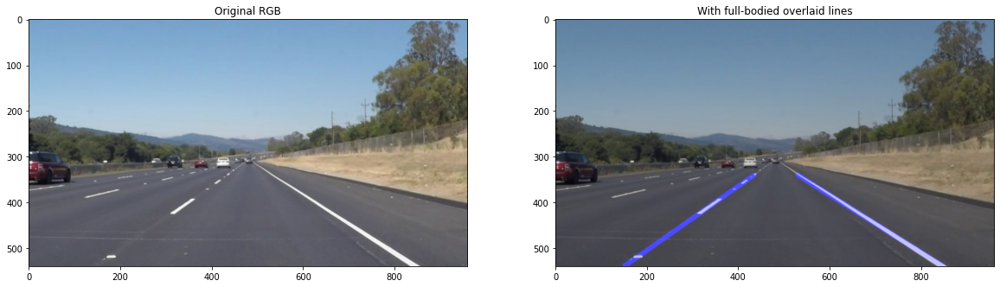

In [26]:
# TESTING THE Process_image() WORFLOW
image = mpimg.imread('test_images/solidWhiteRight.jpg')
result = process_image(image)
plt.figure(figsize=(20,20))
plt.subplot(1,2,1)
plt.imshow(image)
plt.title('Original RGB')
plt.subplot(1,2,2)
plt.imshow(result)
plt.title('With full-bodied overlaid lines')
plt.show()   

Let's try the one with the solid white lane on the right first ...

In [38]:
white_output = 'test_videos_output/solidWhiteRight.mp4'

clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4")
white_clip = clip1.fl_image(process_image) 
%time white_clip.write_videofile(white_output, audio=False)

                                                                                                                       
t:   1%|▌                                                                    | 2/221 [50:04<00:18, 11.55it/s, now=None]
                                                                                                                       
t:   1%|▌                                                                  | 2/221 [00:35<1:05:02, 17.82s/it, now=None]

Moviepy - Building video test_videos_output/solidWhiteRight.mp4.
Moviepy - Writing video test_videos_output/solidWhiteRight.mp4





t:   0%|                                                                             | 0/221 [00:00<?, ?it/s, now=None]

t:   2%|█▏                                                                   | 4/221 [00:00<00:06, 34.57it/s, now=None]

t:   4%|██▍                                                                  | 8/221 [00:00<00:06, 34.48it/s, now=None]

t:   5%|███▋                                                                | 12/221 [00:00<00:06, 34.20it/s, now=None]

t:   7%|████▉                                                               | 16/221 [00:00<00:06, 33.92it/s, now=None]

t:   9%|██████▏                                                             | 20/221 [00:00<00:05, 34.27it/s, now=None]

t:  11%|███████▍                                                            | 24/221 [00:00<00:06, 32.53it/s, now=None]

t:  13%|████████▌                                                           | 28/221 [00:00<00:06, 31.20it/s, now=None]

t:  14%|█████████▊            

t:   1%|▌                                                                  | 2/221 [00:43<1:19:26, 21.76s/it, now=None]

Moviepy - Done !
Moviepy - video ready test_videos_output/solidWhiteRight.mp4
CPU times: total: 3.39 s
Wall time: 7.9 s


Play the video inline, or if you prefer find the video in your filesystem (should be in the same directory) and play it in your video player of choice.

In [42]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))

# Detecting Yellow line

In [43]:
yellow_output = 'test_videos_output/solidYellowLeft.mp4'

clip2 = VideoFileClip("test_videos/solidYellowLeft.mp4")
yellow_clip = clip2.fl_image(process_image)
%time yellow_clip.write_videofile(yellow_output, audio=False)

                                                                                                                       
t:   1%|▌                                                                    | 2/221 [54:41<00:18, 11.55it/s, now=None]
                                                                                                                       
t:   1%|▌                                                                 | 2/221 [05:12<9:30:43, 156.36s/it, now=None]

Moviepy - Building video test_videos_output/solidYellowLeft.mp4.
Moviepy - Writing video test_videos_output/solidYellowLeft.mp4





t:   0%|                                                                             | 0/681 [00:00<?, ?it/s, now=None]

t:   1%|▍                                                                    | 4/681 [00:00<00:21, 31.09it/s, now=None]

t:   1%|▊                                                                    | 8/681 [00:00<00:20, 32.18it/s, now=None]

t:   2%|█▏                                                                  | 12/681 [00:00<00:20, 32.36it/s, now=None]

t:   2%|█▌                                                                  | 16/681 [00:00<00:21, 31.50it/s, now=None]

t:   3%|█▉                                                                  | 20/681 [00:00<00:20, 31.87it/s, now=None]

t:   4%|██▍                                                                 | 24/681 [00:00<00:20, 32.07it/s, now=None]

t:   4%|██▊                                                                 | 28/681 [00:00<00:19, 32.66it/s, now=None]

t:   5%|███▏                  

t:  32%|█████████████████████▎                                             | 216/681 [00:07<00:25, 18.39it/s, now=None]

t:  32%|█████████████████████▌                                             | 219/681 [00:08<00:22, 20.55it/s, now=None]

t:  33%|█████████████████████▊                                             | 222/681 [00:08<00:21, 21.70it/s, now=None]

t:  33%|██████████████████████▏                                            | 225/681 [00:08<00:19, 23.24it/s, now=None]

t:  33%|██████████████████████▍                                            | 228/681 [00:08<00:18, 24.56it/s, now=None]

t:  34%|██████████████████████▋                                            | 231/681 [00:08<00:17, 25.27it/s, now=None]

t:  34%|███████████████████████                                            | 234/681 [00:08<00:16, 26.41it/s, now=None]

t:  35%|███████████████████████▎                                           | 237/681 [00:08<00:16, 26.86it/s, now=None]

t:  35%|███████████████████████▌

t:  62%|█████████████████████████████████████████▊                         | 425/681 [00:15<00:08, 29.74it/s, now=None]

t:  63%|██████████████████████████████████████████                         | 428/681 [00:15<00:08, 29.59it/s, now=None]

t:  63%|██████████████████████████████████████████▌                        | 432/681 [00:15<00:08, 30.16it/s, now=None]

t:  64%|██████████████████████████████████████████▉                        | 436/681 [00:15<00:08, 29.79it/s, now=None]

t:  65%|███████████████████████████████████████████▎                       | 440/681 [00:15<00:07, 30.34it/s, now=None]

t:  65%|███████████████████████████████████████████▋                       | 444/681 [00:15<00:07, 30.26it/s, now=None]

t:  66%|████████████████████████████████████████████                       | 448/681 [00:16<00:07, 31.12it/s, now=None]

t:  66%|████████████████████████████████████████████▍                      | 452/681 [00:16<00:07, 31.28it/s, now=None]

t:  67%|████████████████████████

t:  99%|██████████████████████████████████████████████████████████████████▌| 676/681 [00:23<00:00, 30.82it/s, now=None]

t: 100%|██████████████████████████████████████████████████████████████████▉| 680/681 [00:23<00:00, 30.66it/s, now=None]

                                                                                                                       
t:   1%|▌                                                                    | 2/221 [55:06<00:18, 11.55it/s, now=None]
                                                                                                                       
t:   1%|▌                                                                | 2/221 [05:36<10:14:50, 168.45s/it, now=None]

Moviepy - Done !
Moviepy - video ready test_videos_output/solidYellowLeft.mp4
CPU times: total: 12 s
Wall time: 24.2 s


In [44]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(yellow_output))

In [40]:
challenge_output = 'test_videos_output/challenge.mp4'

clip3 = VideoFileClip('test_videos/challenge.mp4')
challenge_clip = clip3.fl_image(process_image)
%time challenge_clip.write_videofile(challenge_output, audio=False)

                                                                                                                       
t:   1%|▌                                                                    | 2/221 [53:00<00:18, 11.55it/s, now=None]
                                                                                                                       
t:   1%|▌                                                                 | 2/221 [03:31<6:25:25, 105.59s/it, now=None]

Moviepy - Building video test_videos_output/challenge.mp4.
Moviepy - Writing video test_videos_output/challenge.mp4





t:   0%|                                                                             | 0/251 [00:00<?, ?it/s, now=None]

t:   1%|▊                                                                    | 3/251 [00:00<00:10, 24.23it/s, now=None]

t:   2%|█▋                                                                   | 6/251 [00:00<00:11, 20.52it/s, now=None]

t:   4%|██▍                                                                  | 9/251 [00:00<00:13, 17.53it/s, now=None]

t:   4%|██▉                                                                 | 11/251 [00:00<00:13, 17.41it/s, now=None]

t:   5%|███▌                                                                | 13/251 [00:00<00:13, 17.27it/s, now=None]

t:   6%|████                                                                | 15/251 [00:00<00:13, 17.92it/s, now=None]

t:   7%|████▌                                                               | 17/251 [00:00<00:13, 16.82it/s, now=None]

t:   8%|█████▏                

t:  52%|██████████████████████████████████▉                                | 131/251 [00:08<00:08, 14.98it/s, now=None]

t:  53%|███████████████████████████████████▌                               | 133/251 [00:08<00:07, 15.34it/s, now=None]

t:  54%|████████████████████████████████████                               | 135/251 [00:08<00:08, 14.30it/s, now=None]

t:  55%|████████████████████████████████████▌                              | 137/251 [00:08<00:08, 14.08it/s, now=None]

t:  55%|█████████████████████████████████████                              | 139/251 [00:08<00:07, 14.44it/s, now=None]

t:  56%|█████████████████████████████████████▋                             | 141/251 [00:09<00:07, 14.84it/s, now=None]

t:  57%|██████████████████████████████████████▏                            | 143/251 [00:09<00:07, 15.22it/s, now=None]

t:  58%|██████████████████████████████████████▋                            | 145/251 [00:09<00:06, 15.61it/s, now=None]

t:  59%|████████████████████████

t:   1%|▌                                                                 | 2/221 [03:47<6:55:50, 113.93s/it, now=None]

Moviepy - Done !
Moviepy - video ready test_videos_output/challenge.mp4
CPU times: total: 8.27 s
Wall time: 16.7 s


In [41]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(challenge_output))